In [31]:
import tensorflow as tf

In [32]:
modeloGuardado = tf.keras.models.load_model('v1.keras')

In [3]:
import os
import cv2
import numpy as np

def getImages(directorio, size=(256,256)):
    datos = []
    etiquetas = []
    for etiqueta, clase in enumerate(["fumador", "noFumador"]):
        pathClass = os.path.join(directorio, clase)
        for img in os.listdir(pathClass):
            imgPath = os.path.join(pathClass, img)
            imagen = cv2.imread(imgPath)
            if imagen is not None: 
                imagen = cv2.resize(imagen, size)
                datos.append(imagen)
                etiquetas.append(etiqueta)
    return (np.array(datos), np.array(etiquetas))

# Cargar los datos
datos, etiquetas = getImages("data")

# Normalizar los datos
datos = datos / 255.0

from sklearn.model_selection import train_test_split

# Dividir datos en entrenamiento y validación (80% entrenamiento, 20% validación)
X_train, X_val, y_train, y_val = train_test_split(
    datos, 
    etiquetas, 
    test_size=0.2, 
    random_state=42
)

# Mejora del modelo

In [4]:
# Hacer todas las capas del modelo entrenables
modeloGuardado.trainable = True

# Mantener congeladas solo las primeras capas para no sobreajustar el modelo
for capa in modeloGuardado.layers[:-50]:  # Mantener congeladas todas menos las últimas 50 capas
    capa.trainable = False

In [5]:
from tensorflow.keras.optimizers import Adam

# Compilar el modelo nuevamente con una tasa de aprendizaje más baja
modeloGuardado.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])

In [6]:
from tensorflow.keras.callbacks import EarlyStopping

# Definir un callback para detener el entrenamiento si no mejora
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenar el modelo ajustado
history_finetune = modeloGuardado.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=15,
    batch_size=32,
    callbacks=[early_stopping]
)

2024-11-07 21:16:45.566595: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2041577472 exceeds 10% of free system memory.
2024-11-07 21:16:54.962366: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 2041577472 exceeds 10% of free system memory.


Epoch 1/15


I0000 00:00:1731035828.336952   24979 service.cc:146] XLA service 0x7f619c141390 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731035828.338875   24979 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 2070 SUPER, Compute Capability 7.5
2024-11-07 21:17:08.621354: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-07 21:17:09.657594: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-11-07 21:17:26.124392: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng4{} for conv (f32[32,32,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,128,128]{3,2,1,0}, f32[32,1,3,3]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, feature_group_count=32, custom_call_target="__cudnn$convForward", backend_config={"operation_queue_id":"0

 5/82 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8970 - loss: 0.2796

I0000 00:00:1731035836.757912   24979 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


11/82 ━━━━━━━━━━━━━━━━━━━━ 1:42 1s/step - accuracy: 0.8963 - loss: 0.2718

E0000 00:00:1731035839.448008   24982 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1731035839.612074   24982 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1731035846.032374   24981 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1731035846.173668   24981 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2024-11-07 21:17:41.157808: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng34{k2=2,k4=2,k5=0,k6=0,k7=0,k19=0} for conv (f32[9,144,64,64]{3,2,1,0}, u8[0]{0}) custom-call(f

82/82 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - accuracy: 0.8905 - loss: 0.2737 - val_accuracy: 0.9091 - val_loss: 0.2541
Epoch 2/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - accuracy: 0.8967 - loss: 0.2612 - val_accuracy: 0.9076 - val_loss: 0.2541
Epoch 3/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.8901 - loss: 0.2688 - val_accuracy: 0.9106 - val_loss: 0.2551
Epoch 4/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.8861 - loss: 0.2850 - val_accuracy: 0.9045 - val_loss: 0.2530
Epoch 5/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.8896 - loss: 0.2731 - val_accuracy: 0.9106 - val_loss: 0.2553
Epoch 6/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 34s 416ms/step - accuracy: 0.9044 - loss: 0.2511 - val_accuracy: 0.9122 - val_loss: 0.2556
Epoch 7/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.8907 - loss: 0.2752 - val_accuracy: 0.9060 - val_loss: 0.2537
Epoch 8/15
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9012 - loss: 0.2564 - val_accuracy: 0.9076 - val_loss

21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step
Reporte de Clasificación:
               precision    recall  f1-score   support

     Fumador       0.91      0.94      0.93       428
  No Fumador       0.88      0.83      0.86       221

    accuracy                           0.90       649
   macro avg       0.90      0.89      0.89       649
weighted avg       0.90      0.90      0.90       649



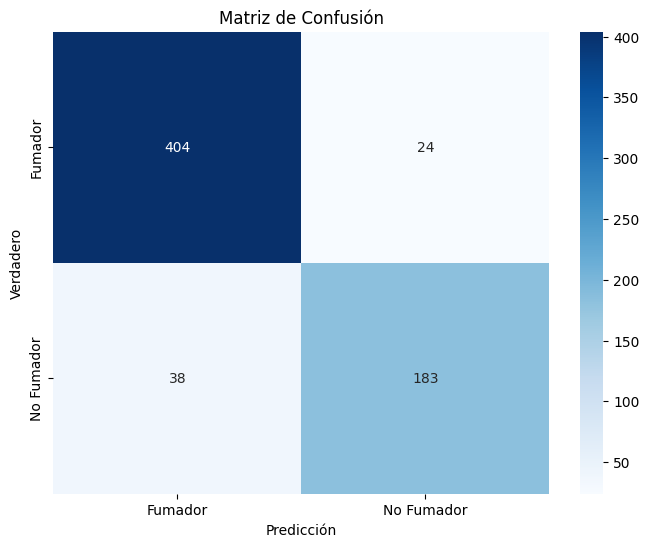

In [7]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Predecir las probabilidades en los datos de validación
predicciones_proba = modeloGuardado.predict(X_val)

# Convertir probabilidades en etiquetas (umbral = 0.5)
predicciones = (predicciones_proba > 0.5).astype(int).flatten()

# Generar el reporte de clasificación
reporte = classification_report(y_val, predicciones, target_names=["Fumador", "No Fumador"])
print("Reporte de Clasificación:\n", reporte)

# Generar la matriz de confusión
matriz_confusion = confusion_matrix(y_val, predicciones)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt='d', cmap='Blues', xticklabels=["Fumador", "No Fumador"], yticklabels=["Fumador", "No Fumador"])
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.title('Matriz de Confusión')
plt.show()

Mapas de saliencia para fumadores:


W0000 00:00:1731036868.671124   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.683198   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.684892   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.685930   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.686945   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.689728   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.690918   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.691926   25983 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1731036868.693370   25983 gp

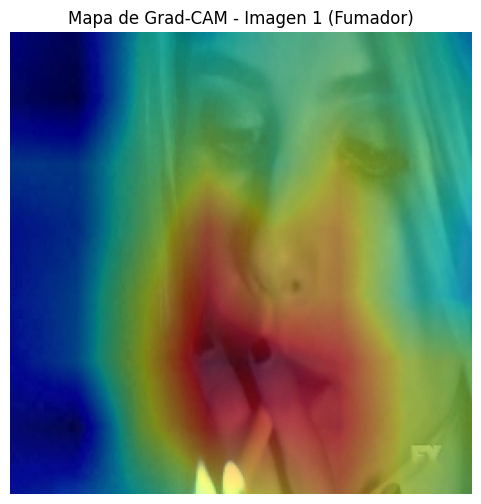

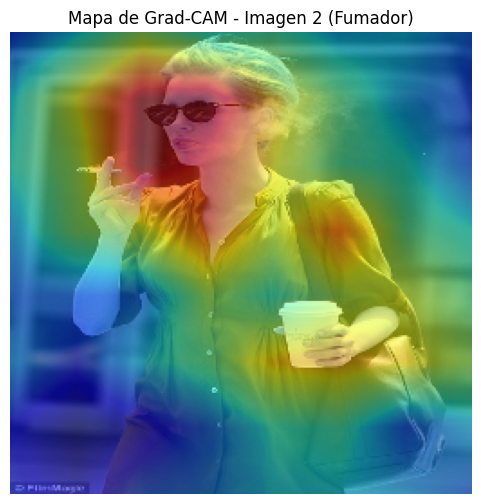

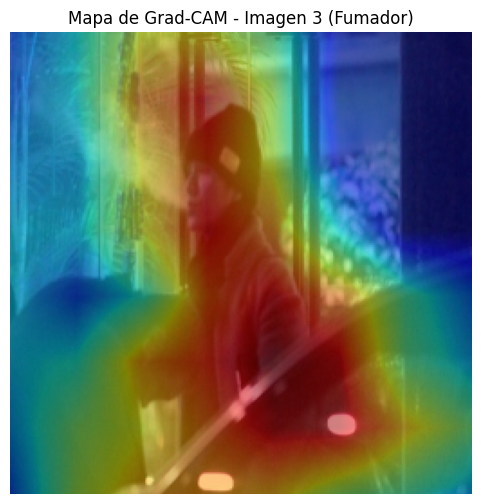

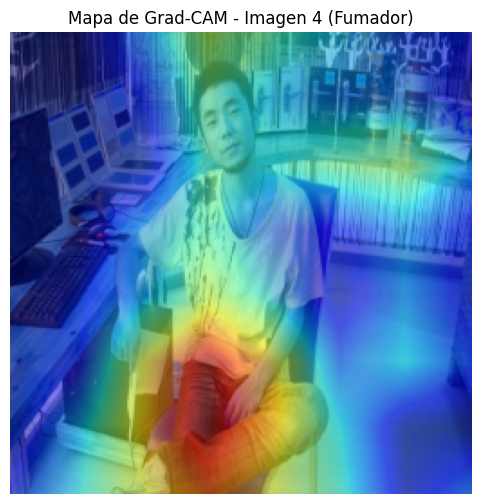

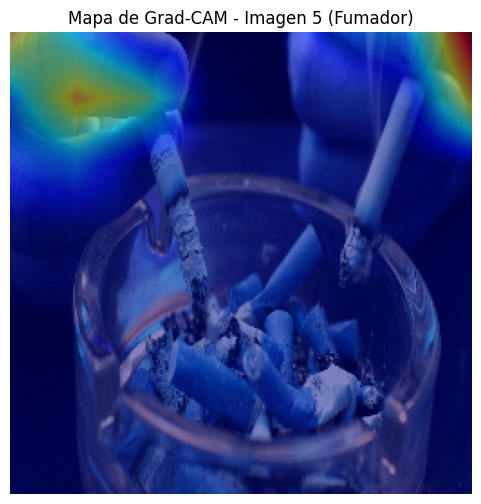

Mapas de saliencia para no fumadores:


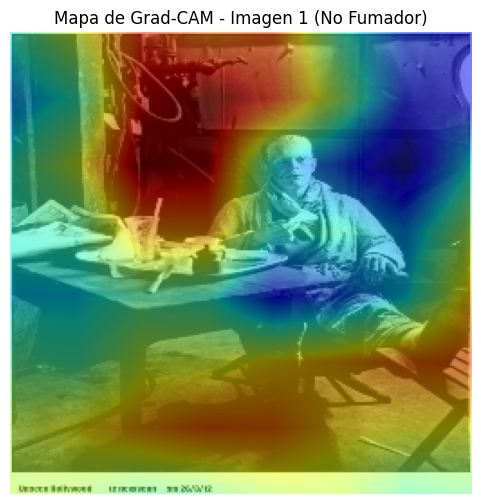

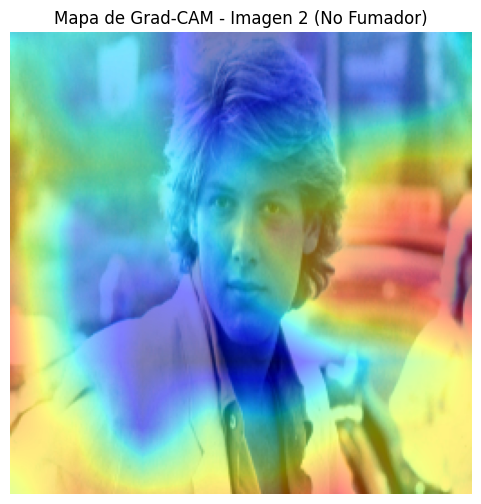

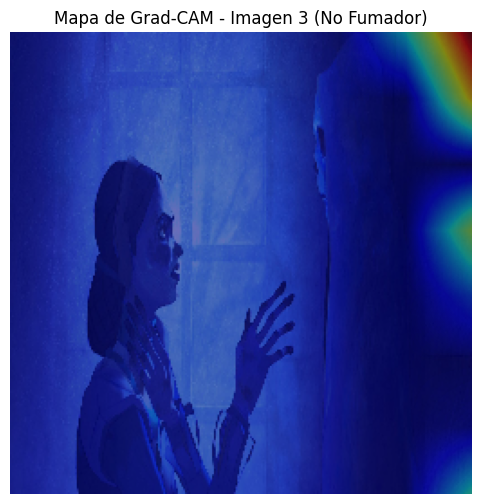

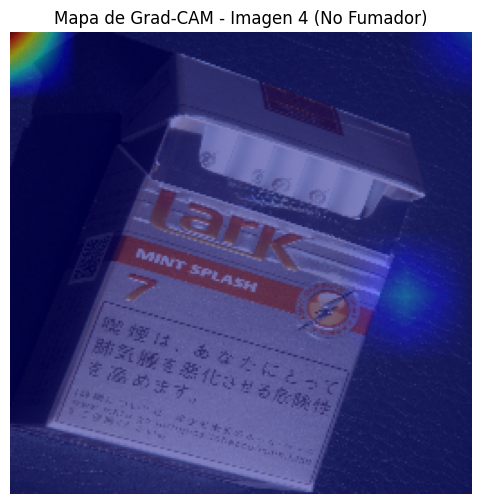

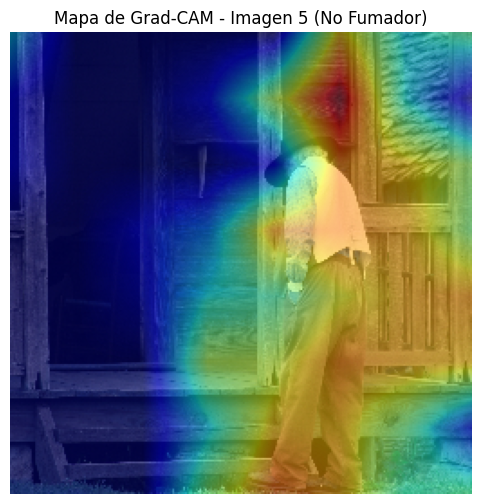

In [33]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import cv2
from tf_keras_vis.utils.scores import BinaryScore
from tf_keras_vis.gradcam import Gradcam
from tensorflow.keras.models import load_model

# Configuración de la semilla para reproducibilidad
random.seed(8)

# Cargar el modelo guardado
modeloGuardado = load_model('v1.keras')

# Inicializar Grad-CAM con puntuación binaria
score = BinaryScore(0)  # Usamos el índice 0, porque solo hay una salida (probabilidad de clase 1)
gradcam = Gradcam(modeloGuardado, model_modifier=None, clone=False)

# Función para seleccionar imágenes aleatorias
def seleccionar_imagenes_aleatorias(directorio_clase, n=5):
    lista_imagenes = os.listdir(directorio_clase)
    lista_imagenes = [img for img in lista_imagenes if img.endswith(('.jpg', '.png', '.jpeg'))]
    imagenes_seleccionadas = random.sample(lista_imagenes, n)
    return [os.path.join(directorio_clase, img) for img in imagenes_seleccionadas]

# Función para generar y mostrar los mapas de saliencia
def generar_saliency_maps(lista_imagenes, score, gradcam, clase_nombre):
    for i, ruta_imagen in enumerate(lista_imagenes):
        # Cargar y preprocesar la imagen
        imagen = cv2.imread(ruta_imagen)
        imagen = cv2.resize(imagen, (256, 256)) / 255.0
        imagen = np.expand_dims(imagen, axis=0)

        # Generar el mapa de Grad-CAM
        saliency_map = gradcam(score, imagen)

        # Visualización
        plt.figure(figsize=(6, 6))
        plt.imshow(imagen[0])
        plt.imshow(saliency_map[0], cmap='jet', alpha=0.5)  # Superponer mapa de calor
        plt.title(f"Mapa de Grad-CAM - Imagen {i+1} ({clase_nombre})")
        plt.axis('off')
        plt.show()

# Directorios para cada clase
directorio_fumador = "data/fumador"
directorio_no_fumador = "data/noFumador"

# Seleccionar 5 imágenes aleatorias de cada clase
imagenes_fumador = seleccionar_imagenes_aleatorias(directorio_fumador, 5)
imagenes_no_fumador = seleccionar_imagenes_aleatorias(directorio_no_fumador, 5)

# Generar mapas de saliencia para las imágenes de fumadores
print("Mapas de saliencia para fumadores:")
generar_saliency_maps(imagenes_fumador, score, gradcam, "Fumador")

# Generar mapas de saliencia para las imágenes de no fumadores
print("Mapas de saliencia para no fumadores:")
generar_saliency_maps(imagenes_no_fumador, score, gradcam, "No Fumador")

In [8]:
modeloGuardado.save('v2.keras')

# Aumentar la data

In [1]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

# Definir las transformaciones de data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Directorios de entrada y salida
classes = ['fumador', 'noFumador']
input_dir = 'data'
output_dir = 'augmented_data'

# Crear los directorios de salida si no existen
for clase in classes:
    os.makedirs(os.path.join(output_dir, clase), exist_ok=True)

# Generar imágenes aumentadas
for clase in classes:
    print(f"Generando imágenes aumentadas para la clase: {clase}")
    # Obtener la lista de imágenes de la clase
    class_dir = os.path.join(input_dir, clase)
    images = os.listdir(class_dir)
    num_generated_files = 0
    total_images_needed = 500  # Número total de imágenes adicionales por clase

    while num_generated_files < total_images_needed:
        for img_name in images:
            image_path = os.path.join(class_dir, img_name)
            # Cargar la imagen
            image = load_img(image_path)
            # Convertir la imagen a un arreglo numpy
            x = img_to_array(image)
            x = np.expand_dims(x, axis=0)

            # Generar imágenes aumentadas y guardarlas en disco
            i = 0
            for batch in datagen.flow(x, batch_size=1,
                                      save_to_dir=os.path.join(output_dir, clase),
                                      save_prefix='aug',
                                      save_format='jpg'):
                i += 1
                num_generated_files += 1
                if num_generated_files >= total_images_needed:
                    break
                if i >= 1:
                    break  # Generar solo una imagen aumentada por imagen original en cada iteración
            if num_generated_files >= total_images_needed:
                break
    print(f"Se generaron {num_generated_files} imágenes para la clase {clase}")

2024-11-07 21:19:18.815148: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-07 21:19:18.957933: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-07 21:19:18.994826: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-07 21:19:19.113649: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-07 21:19:20.689882: W tensorflow/compiler/tf2

Generando imágenes aumentadas para la clase: fumador
Se generaron 500 imágenes para la clase fumador
Generando imágenes aumentadas para la clase: noFumador


/home/angel/DL-Proyecto/myenv/lib/python3.10/site-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Se generaron 500 imágenes para la clase noFumador


In [42]:
import tensorflow as tf

# Cargar el modelo previamente entrenado
modeloGuardado = tf.keras.models.load_model('v2.keras')

In [43]:
import os
import cv2
import numpy as np

def getImages(directories, size=(256,256)):
    datos = []
    etiquetas = []
    for directorio in directories:
        for etiqueta, clase in enumerate(["fumador", "noFumador"]):
            pathClass = os.path.join(directorio, clase)
            for img in os.listdir(pathClass):
                imgPath = os.path.join(pathClass, img)
                imagen = cv2.imread(imgPath)
                if imagen is not None: 
                    imagen = cv2.resize(imagen, size)
                    datos.append(imagen)
                    etiquetas.append(etiqueta)
    return (np.array(datos), np.array(etiquetas))

# Cargar imágenes desde 'data' y 'augmented_data'
datos, etiquetas = getImages(["augmented_data"])

# Normalizar los datos
datos = datos / 255.0

# Dividir los datos en entrenamiento y validación
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
    datos, 
    etiquetas, 
    test_size=0.2, 
    random_state=42
)

In [44]:
# Hacer todas las capas del modelo entrenables
modeloGuardado.trainable = True

# Mantener congeladas solo las primeras capas para no sobreajustar el modelo
for capa in modeloGuardado.layers[:-50]:  # Mantener congeladas todas menos las últimas 50 capas
    capa.trainable = False

# Compilar el modelo nuevamente con una tasa de aprendizaje más baja
from tensorflow.keras.optimizers import Adam

modeloGuardado.compile(optimizer=Adam(learning_rate=1e-7), 
                       loss='binary_crossentropy', 
                       metrics=['accuracy'])

In [45]:
from tensorflow.keras.callbacks import EarlyStopping

# Definir un callback para detener el entrenamiento si no mejora
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Continuar el entrenamiento
history = modeloGuardado.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=200,
    batch_size=64,
    callbacks=[early_stopping]
)

Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 10s 429ms/step - accuracy: 0.8477 - loss: 0.3467 - val_accuracy: 0.8367 - val_loss: 0.3700
Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8537 - loss: 0.3269 - val_accuracy: 0.8367 - val_loss: 0.3699
Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8478 - loss: 0.3443 - val_accuracy: 0.8367 - val_loss: 0.3698
Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8373 - loss: 0.3527 - val_accuracy: 0.8367 - val_loss: 0.3697
Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.8613 - loss: 0.3254 - val_accuracy: 0.8367 - val_loss: 0.3696
Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.8308 - loss: 0.3577 - val_accuracy: 0.8367 - val_loss: 0.3695
Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.8245 - loss: 0.3692 - val_accuracy: 0.8367 - val_loss: 0.3694
Epoch 8/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - accuracy: 0.8385 - loss: 0.3660 - val_accuracy: 

In [46]:
modeloGuardado.save('v3.keras')

7/7 ━━━━━━━━━━━━━━━━━━━━ 18s 319ms/step
Reporte de Clasificación:
               precision    recall  f1-score   support

     Fumador       0.84      0.89      0.86        96
  No Fumador       0.88      0.84      0.86       100

    accuracy                           0.86       196
   macro avg       0.86      0.86      0.86       196
weighted avg       0.86      0.86      0.86       196



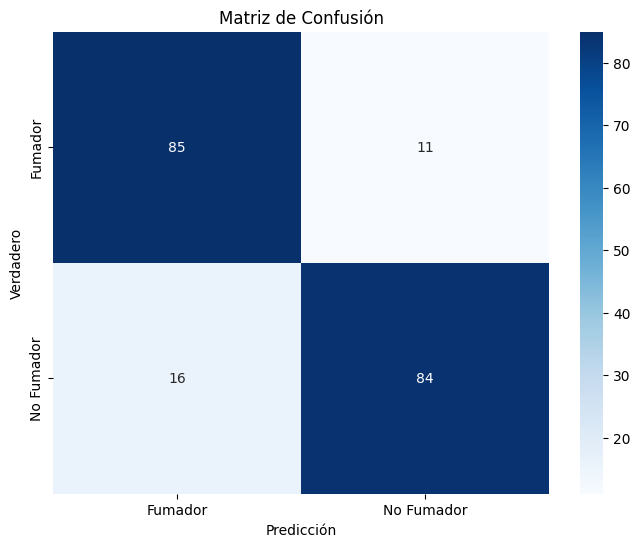

In [47]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Predecir las probabilidades en los datos de validación
predicciones_proba = modeloGuardado.predict(X_val)

# Convertir probabilidades en etiquetas (umbral = 0.5)
predicciones = (predicciones_proba > 0.5).astype(int).flatten()

# Generar el reporte de clasificación
reporte = classification_report(y_val, predicciones, target_names=["Fumador", "No Fumador"])
print("Reporte de Clasificación:\n", reporte)

# Generar la matriz de confusión
matriz_confusion = confusion_matrix(y_val, predicciones)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt='d', cmap='Blues', 
            xticklabels=["Fumador", "No Fumador"], yticklabels=["Fumador", "No Fumador"])
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.title('Matriz de Confusión')
plt.show()

In [48]:
import cv2
import numpy as np

def predecir_fumador(ruta_imagen, modeloGuardado):
    # Cargar la imagen desde la ruta especificada
    imagen = cv2.imread(ruta_imagen)
    
    if imagen is None:
        print(f"No se pudo cargar la imagen en {ruta_imagen}. Asegúrate de que la ruta sea correcta.")
        return
    
    # Preprocesar la imagen: redimensionar y normalizar
    imagen = cv2.resize(imagen, (256, 256))  # Redimensionar al tamaño esperado por el modelo
    imagen = imagen / 255.0  # Normalizar al rango [0, 1]
    imagen = np.expand_dims(imagen, axis=0)  # Añadir una dimensión para representar el batch (1, 256, 256, 3)

    # Realizar la predicción
    prediccion = modeloGuardado.predict(imagen)
    
    # Interpretar la predicción
    if prediccion[0][0] > 0.5:
        resultado = "No fumador"
    else:
        resultado = "Fumador"
    
    # Mostrar el resultado
    print(f"Resultado de la predicción para la imagen {ruta_imagen}: {resultado}")
    return resultado

In [49]:
fumador = 'augmented_data/fumador/aug_0_6.jpg'
nofumador = 'augmented_data/noFumador/aug_0_4.jpg'

predecir_fumador(fumador, modeloGuardado)
predecir_fumador(nofumador, modeloGuardado)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step
Resultado de la predicción para la imagen augmented_data/fumador/aug_0_6.jpg: Fumador
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Resultado de la predicción para la imagen augmented_data/noFumador/aug_0_4.jpg: No fumador


'No fumador'

In [50]:
fumador = 'data/fumador/000-0.jpg'
nofumador = 'data/noFumador/000296.jpg'

predecir_fumador(fumador, modeloGuardado)
predecir_fumador(nofumador, modeloGuardado)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Resultado de la predicción para la imagen data/fumador/000-0.jpg: Fumador
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Resultado de la predicción para la imagen data/noFumador/000296.jpg: Fumador


'Fumador'

In [51]:
import tensorflow as tf

# Cargar el modelo previamente entrenado
modeloGuardado = tf.keras.models.load_model('v3.keras')

Mapas de saliencia para fumadores:


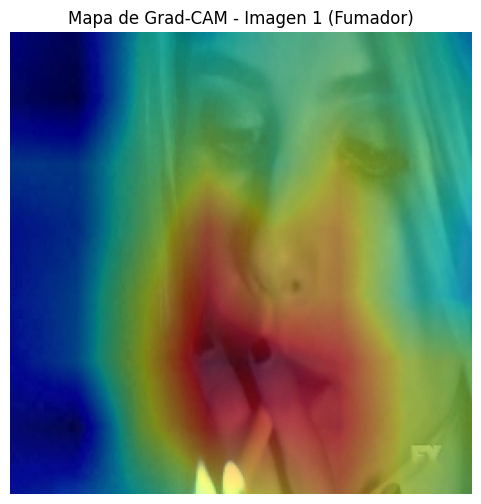

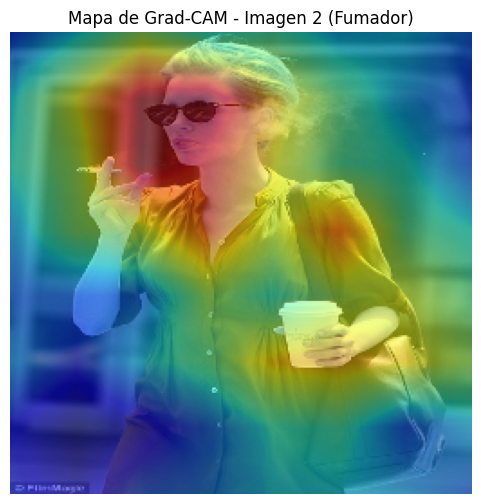

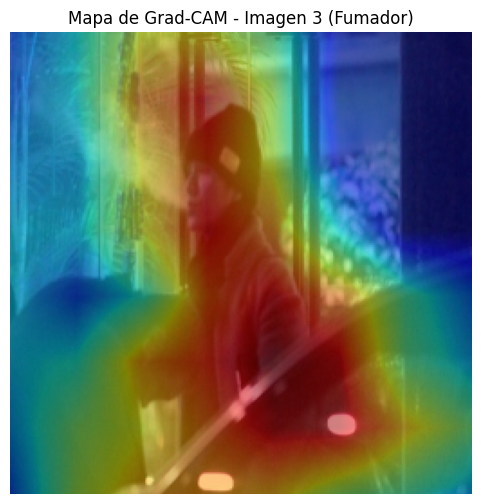

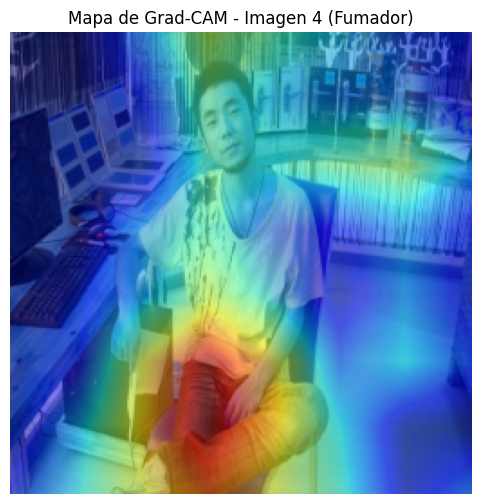

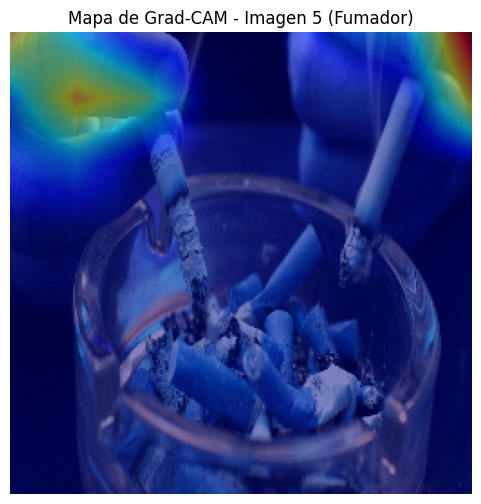

Mapas de saliencia para no fumadores:


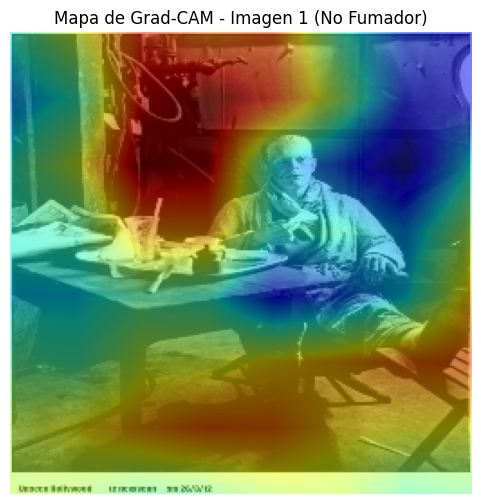

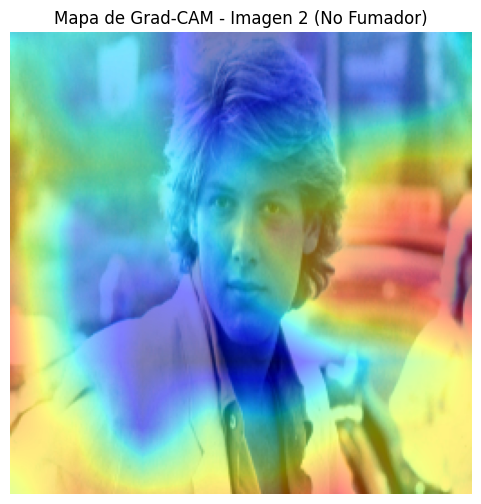

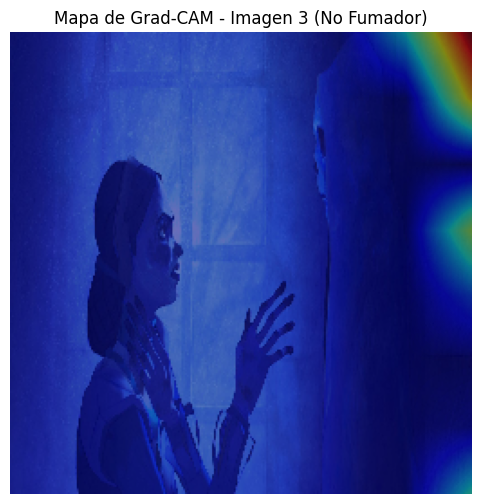

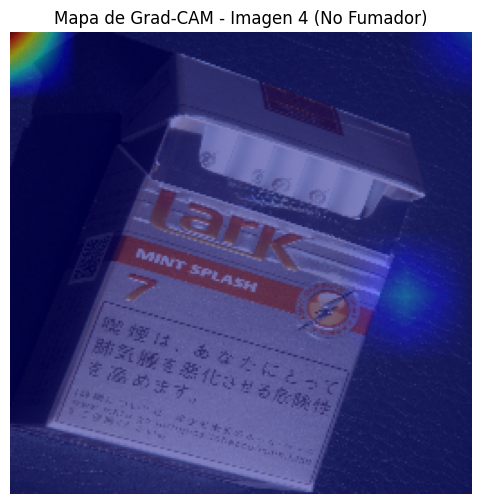

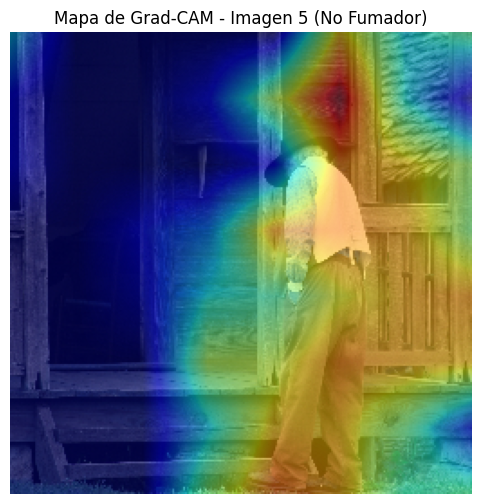

In [52]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import cv2
from tf_keras_vis.utils.scores import BinaryScore
from tf_keras_vis.gradcam import Gradcam
from tensorflow.keras.models import load_model

# Configuración de la semilla para reproducibilidad
random.seed(8)

# Cargar el modelo guardado
modeloGuardado = load_model('v1.keras')

# Inicializar Grad-CAM con puntuación binaria
score = BinaryScore(0)  # Usamos el índice 0, porque solo hay una salida (probabilidad de clase 1)
gradcam = Gradcam(modeloGuardado, model_modifier=None, clone=False)

# Función para seleccionar imágenes aleatorias
def seleccionar_imagenes_aleatorias(directorio_clase, n=5):
    lista_imagenes = os.listdir(directorio_clase)
    lista_imagenes = [img for img in lista_imagenes if img.endswith(('.jpg', '.png', '.jpeg'))]
    imagenes_seleccionadas = random.sample(lista_imagenes, n)
    return [os.path.join(directorio_clase, img) for img in imagenes_seleccionadas]

# Función para generar y mostrar los mapas de saliencia
def generar_saliency_maps(lista_imagenes, score, gradcam, clase_nombre):
    for i, ruta_imagen in enumerate(lista_imagenes):
        # Cargar y preprocesar la imagen
        imagen = cv2.imread(ruta_imagen)
        imagen = cv2.resize(imagen, (256, 256)) / 255.0
        imagen = np.expand_dims(imagen, axis=0)

        # Generar el mapa de Grad-CAM
        saliency_map = gradcam(score, imagen)

        # Visualización
        plt.figure(figsize=(6, 6))
        plt.imshow(imagen[0])
        plt.imshow(saliency_map[0], cmap='jet', alpha=0.5)  # Superponer mapa de calor
        plt.title(f"Mapa de Grad-CAM - Imagen {i+1} ({clase_nombre})")
        plt.axis('off')
        plt.show()

# Directorios para cada clase
directorio_fumador = "data/fumador"
directorio_no_fumador = "data/noFumador"

# Seleccionar 5 imágenes aleatorias de cada clase
imagenes_fumador = seleccionar_imagenes_aleatorias(directorio_fumador, 5)
imagenes_no_fumador = seleccionar_imagenes_aleatorias(directorio_no_fumador, 5)

# Generar mapas de saliencia para las imágenes de fumadores
print("Mapas de saliencia para fumadores:")
generar_saliency_maps(imagenes_fumador, score, gradcam, "Fumador")

# Generar mapas de saliencia para las imágenes de no fumadores
print("Mapas de saliencia para no fumadores:")
generar_saliency_maps(imagenes_no_fumador, score, gradcam, "No Fumador")

# Entrenando la versión original con la data nueva

In [62]:
import tensorflow as tf

# Cargar el modelo previamente entrenado
modeloGuardado = tf.keras.models.load_model('v1.keras')

In [63]:
import os
import cv2
import numpy as np

def getImages(directories, size=(256,256)):
    datos = []
    etiquetas = []
    for directorio in directories:
        for etiqueta, clase in enumerate(["fumador", "noFumador"]):
            pathClass = os.path.join(directorio, clase)
            for img in os.listdir(pathClass):
                imgPath = os.path.join(pathClass, img)
                imagen = cv2.imread(imgPath)
                if imagen is not None: 
                    imagen = cv2.resize(imagen, size)
                    datos.append(imagen)
                    etiquetas.append(etiqueta)
    return (np.array(datos), np.array(etiquetas))

# Cargar imágenes desde 'data' y 'augmented_data'
datos, etiquetas = getImages(["augmented_data"])

# Normalizar los datos
datos = datos / 255.0

# Dividir los datos en entrenamiento y validación
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
    datos, 
    etiquetas, 
    test_size=0.2, 
    random_state=42
)

In [64]:
# Hacer todas las capas del modelo entrenables
modeloGuardado.trainable = True

# Mantener congeladas solo las primeras capas para no sobreajustar el modelo
for capa in modeloGuardado.layers[:-50]:  # Mantener congeladas todas menos las últimas 50 capas
    capa.trainable = False

# Compilar el modelo nuevamente con una tasa de aprendizaje más baja
from tensorflow.keras.optimizers import Adam

modeloGuardado.compile(optimizer=Adam(learning_rate=1e-7), 
                       loss='binary_crossentropy', 
                       metrics=['accuracy'])

In [65]:
modeloGuardado.save('v1_2.keras')

In [66]:
from tensorflow.keras.callbacks import EarlyStopping

# Definir un callback para detener el entrenamiento si no mejora
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Continuar el entrenamiento
history = modeloGuardado.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=200,
    batch_size=64,
    callbacks=[early_stopping]
)

Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 9s 415ms/step - accuracy: 0.8539 - loss: 0.3553 - val_accuracy: 0.8622 - val_loss: 0.3670
Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.8563 - loss: 0.3275 - val_accuracy: 0.8622 - val_loss: 0.3670
Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy: 0.8355 - loss: 0.3504 - val_accuracy: 0.8622 - val_loss: 0.3669
Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8527 - loss: 0.3417 - val_accuracy: 0.8622 - val_loss: 0.3669
Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8622 - loss: 0.3218 - val_accuracy: 0.8622 - val_loss: 0.3669
Epoch 6/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.8529 - loss: 0.3377 - val_accuracy: 0.8622 - val_loss: 0.3669
Epoch 7/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.8503 - loss: 0.3429 - val_accuracy: 0.8622 - val_loss: 0.3668
Epoch 8/200
13/13 ━━━━━━━━━━━━━━━━━━━━ -14s 58ms/step - accuracy: 0.8311 - loss: 0.3428 - val_accuracy:

# Validar el modelo

7/7 ━━━━━━━━━━━━━━━━━━━━ 4s 295ms/step
Reporte de Clasificación:
               precision    recall  f1-score   support

     Fumador       0.84      0.88      0.86        96
  No Fumador       0.88      0.84      0.86       100

    accuracy                           0.86       196
   macro avg       0.86      0.86      0.86       196
weighted avg       0.86      0.86      0.86       196



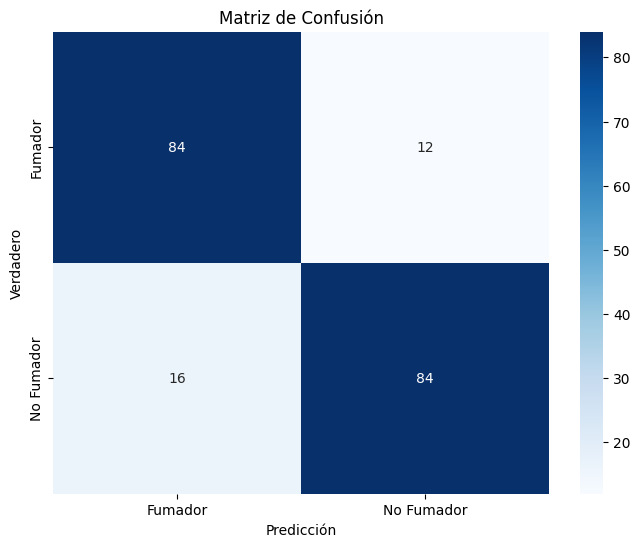

In [67]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Predecir las probabilidades en los datos de validación
predicciones_proba = modeloGuardado.predict(X_val)

# Convertir probabilidades en etiquetas (umbral = 0.5)
predicciones = (predicciones_proba > 0.5).astype(int).flatten()

# Generar el reporte de clasificación
reporte = classification_report(y_val, predicciones, target_names=["Fumador", "No Fumador"])
print("Reporte de Clasificación:\n", reporte)

# Generar la matriz de confusión
matriz_confusion = confusion_matrix(y_val, predicciones)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt='d', cmap='Blues', 
            xticklabels=["Fumador", "No Fumador"], yticklabels=["Fumador", "No Fumador"])
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.title('Matriz de Confusión')
plt.show()

In [68]:
import cv2
import numpy as np

def predecir_fumador(ruta_imagen, modeloGuardado):
    # Cargar la imagen desde la ruta especificada
    imagen = cv2.imread(ruta_imagen)
    
    if imagen is None:
        print(f"No se pudo cargar la imagen en {ruta_imagen}. Asegúrate de que la ruta sea correcta.")
        return
    
    # Preprocesar la imagen: redimensionar y normalizar
    imagen = cv2.resize(imagen, (256, 256))  # Redimensionar al tamaño esperado por el modelo
    imagen = imagen / 255.0  # Normalizar al rango [0, 1]
    imagen = np.expand_dims(imagen, axis=0)  # Añadir una dimensión para representar el batch (1, 256, 256, 3)

    # Realizar la predicción
    prediccion = modeloGuardado.predict(imagen)
    
    # Interpretar la predicción
    if prediccion[0][0] > 0.5:
        resultado = "No fumador"
    else:
        resultado = "Fumador"
    
    # Mostrar el resultado
    print(f"Resultado de la predicción para la imagen {ruta_imagen}: {resultado}")
    return resultado

In [69]:
fumador = 'augmented_data/fumador/aug_0_6.jpg'
nofumador = 'augmented_data/noFumador/aug_0_4.jpg'

predecir_fumador(fumador, modeloGuardado)
predecir_fumador(nofumador, modeloGuardado)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 884ms/step
Resultado de la predicción para la imagen augmented_data/fumador/aug_0_6.jpg: Fumador
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Resultado de la predicción para la imagen augmented_data/noFumador/aug_0_4.jpg: No fumador


'No fumador'

In [70]:
fumador = 'data/fumador/000-0.jpg'
nofumador = 'data/noFumador/000296.jpg'

predecir_fumador(fumador, modeloGuardado)
predecir_fumador(nofumador, modeloGuardado)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Resultado de la predicción para la imagen data/fumador/000-0.jpg: Fumador
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Resultado de la predicción para la imagen data/noFumador/000296.jpg: Fumador


'Fumador'

Mapas de saliencia para fumadores:


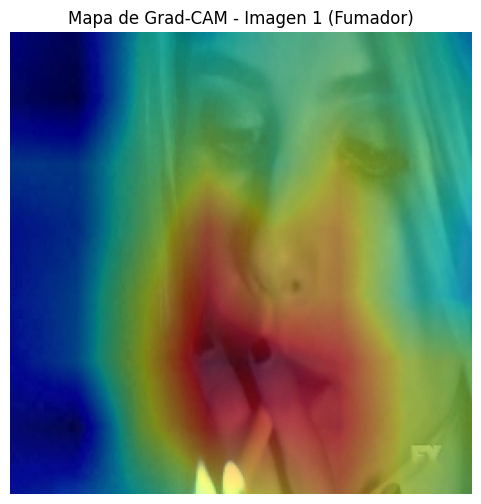

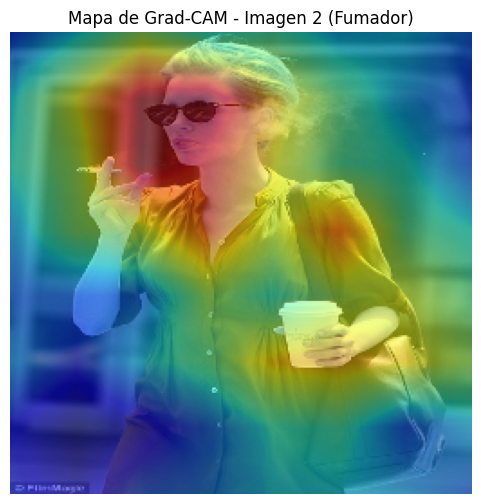

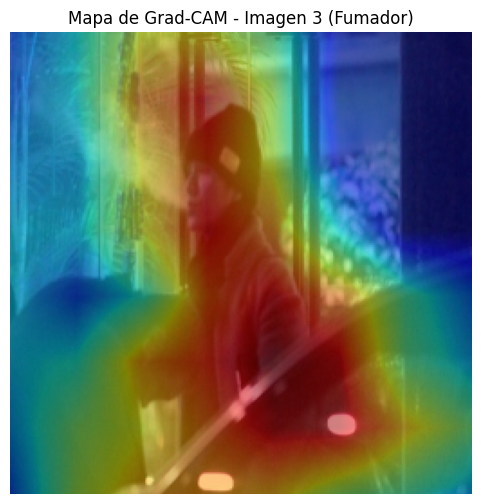

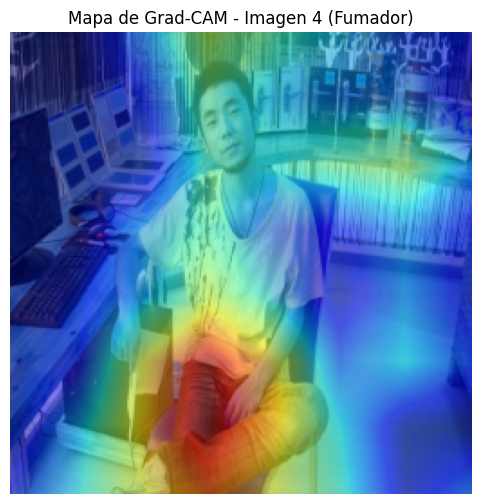

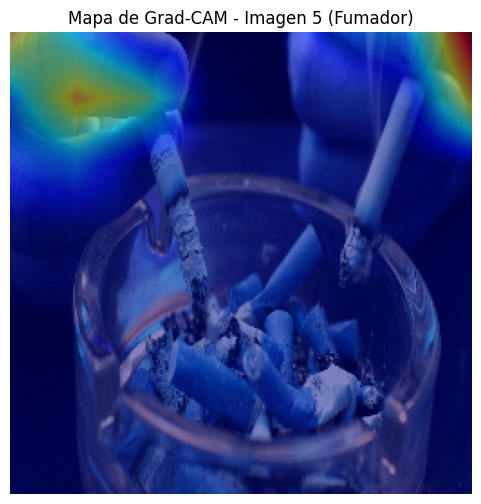

Mapas de saliencia para no fumadores:


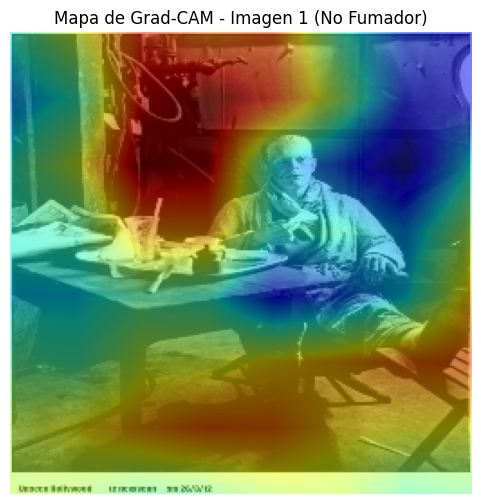

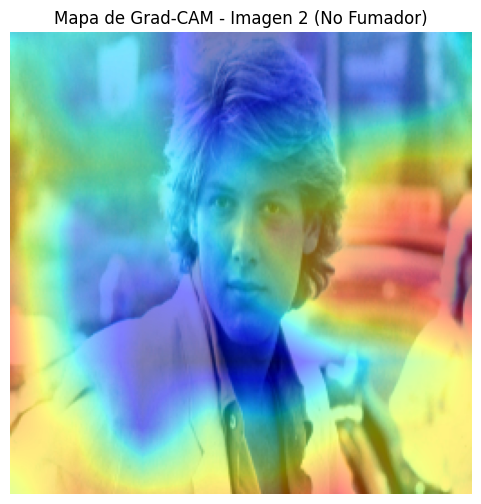

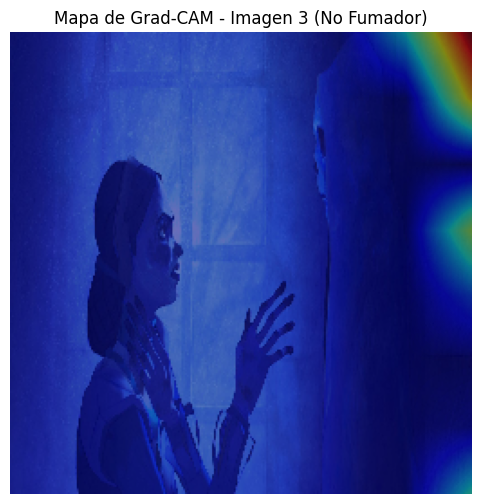

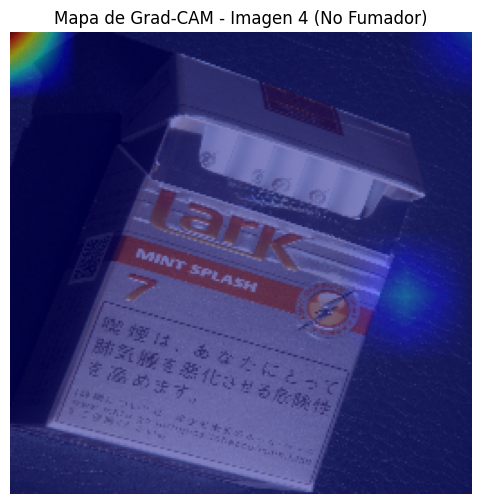

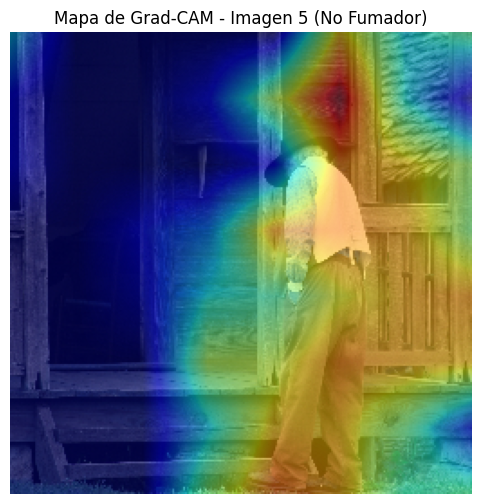

In [71]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import cv2
from tf_keras_vis.utils.scores import BinaryScore
from tf_keras_vis.gradcam import Gradcam
from tensorflow.keras.models import load_model

# Configuración de la semilla para reproducibilidad
random.seed(8)

# Cargar el modelo guardado
modeloGuardado = load_model('v1.keras')

# Inicializar Grad-CAM con puntuación binaria
score = BinaryScore(0)  # Usamos el índice 0, porque solo hay una salida (probabilidad de clase 1)
gradcam = Gradcam(modeloGuardado, model_modifier=None, clone=False)

# Función para seleccionar imágenes aleatorias
def seleccionar_imagenes_aleatorias(directorio_clase, n=5):
    lista_imagenes = os.listdir(directorio_clase)
    lista_imagenes = [img for img in lista_imagenes if img.endswith(('.jpg', '.png', '.jpeg'))]
    imagenes_seleccionadas = random.sample(lista_imagenes, n)
    return [os.path.join(directorio_clase, img) for img in imagenes_seleccionadas]

# Función para generar y mostrar los mapas de saliencia
def generar_saliency_maps(lista_imagenes, score, gradcam, clase_nombre):
    for i, ruta_imagen in enumerate(lista_imagenes):
        # Cargar y preprocesar la imagen
        imagen = cv2.imread(ruta_imagen)
        imagen = cv2.resize(imagen, (256, 256)) / 255.0
        imagen = np.expand_dims(imagen, axis=0)

        # Generar el mapa de Grad-CAM
        saliency_map = gradcam(score, imagen)

        # Visualización
        plt.figure(figsize=(6, 6))
        plt.imshow(imagen[0])
        plt.imshow(saliency_map[0], cmap='jet', alpha=0.5)  # Superponer mapa de calor
        plt.title(f"Mapa de Grad-CAM - Imagen {i+1} ({clase_nombre})")
        plt.axis('off')
        plt.show()

# Directorios para cada clase
directorio_fumador = "data/fumador"
directorio_no_fumador = "data/noFumador"

# Seleccionar 5 imágenes aleatorias de cada clase
imagenes_fumador = seleccionar_imagenes_aleatorias(directorio_fumador, 5)
imagenes_no_fumador = seleccionar_imagenes_aleatorias(directorio_no_fumador, 5)

# Generar mapas de saliencia para las imágenes de fumadores
print("Mapas de saliencia para fumadores:")
generar_saliency_maps(imagenes_fumador, score, gradcam, "Fumador")

# Generar mapas de saliencia para las imágenes de no fumadores
print("Mapas de saliencia para no fumadores:")
generar_saliency_maps(imagenes_no_fumador, score, gradcam, "No Fumador")

# Entrenando con toda la data un nuevo modelo

In [1]:
import os
import cv2
import numpy as np

def getImages(directories, size=(256,256)):
    datos = []
    etiquetas = []
    for directorio in directories:
        for etiqueta, clase in enumerate(["fumador", "noFumador"]):
            pathClass = os.path.join(directorio, clase)
            for img in os.listdir(pathClass):
                imgPath = os.path.join(pathClass, img)
                imagen = cv2.imread(imgPath)
                if imagen is not None: 
                    imagen = cv2.resize(imagen, size)
                    datos.append(imagen)
                    etiquetas.append(etiqueta)
    return (np.array(datos), np.array(etiquetas))

# Cargar imágenes desde 'data' y 'augmented_data'
datos, etiquetas = getImages(["data", "augmented_data"])

# Normalizar los datos
datos = datos / 255.0

# Dividir los datos en entrenamiento y validación
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(
    datos, 
    etiquetas, 
    test_size=0.2, 
    random_state=42
)

In [2]:
noFumadores = datos[etiquetas == 1]
fumadores = datos[etiquetas == 0]

print("No fumadores: ", noFumadores.shape)
print("Fumadores: ", fumadores.shape)

: 

In [ ]:
# Paso 2: Separar las clases
datos_fumadores = datos[etiquetas == 0]
etiquetas_fumadores = etiquetas[etiquetas == 0]

datos_no_fumadores = datos[etiquetas == 1]
etiquetas_no_fumadores = etiquetas[etiquetas == 1]

In [ ]:
# Paso 3: Definir el número de muestras (tamaño mínimo de ambas clases)
n_samples = min(len(datos_fumadores), len(datos_no_fumadores))

In [ ]:
# Paso 4: Reducir ambas clases al tamaño mínimo (undersampling)
from sklearn.utils import resample
datos_fumadores_reducidos, etiquetas_fumadores_reducidos = resample(
    datos_fumadores,
    etiquetas_fumadores,
    replace=False,
    n_samples=n_samples,
    random_state=42
)

In [ ]:
datos_no_fumadores_reducidos, etiquetas_no_fumadores_reducidos = resample(
    datos_no_fumadores,
    etiquetas_no_fumadores,
    replace=False,
    n_samples=n_samples,
    random_state=42
)

In [ ]:
# Paso 5: Concatenar los datos balanceados
datos = np.concatenate((datos_fumadores_reducidos, datos_no_fumadores_reducidos))
etiquetas = np.concatenate((etiquetas_fumadores_reducidos, etiquetas_no_fumadores_reducidos))

In [ ]:
# Paso 6: Verificar el tamaño de cada clase
noFumadores = datos[etiquetas == 1]
fumadores = datos[etiquetas == 0]

In [ ]:
print("No fumadores: ", noFumadores.shape)
print("Fumadores: ", fumadores.shape)

In [ ]:
datos = datos / 255.0

In [ ]:
from sklearn.model_selection import train_test_split
# Dividir datos en entrenamiento y validación (80% entrenamiento, 20% validación)
X_train, X_val, y_train, y_val = train_test_split(
    datos, 
    etiquetas, 
    test_size=0.2, 
    random_state=42
)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Cargar el modelo base preentrenado
base_model = MobileNetV2(input_shape=(256, 256, 3), include_top=False, weights='imagenet')
base_model.trainable = False  # Congelar las capas del modelo base

# Añadir capas personalizadas para la clasificación binaria
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)

# Definir el modelo
model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

# Definir un callback para detener el entrenamiento si no mejora
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=50,
    batch_size=64,
    callbacks=[early_stopping]
)

In [ ]:
model.save('v4.keras')

# Validar el modelo

In [ ]:
import tensorflow as tf

# Cargar el modelo previamente entrenado
modeloGuardado = tf.keras.models.load_model('v4.keras')

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Predecir las probabilidades en los datos de validación
predicciones_proba = modeloGuardado.predict(X_val)

# Convertir probabilidades en etiquetas (umbral = 0.5)
predicciones = (predicciones_proba > 0.5).astype(int).flatten()

# Generar el reporte de clasificación
reporte = classification_report(y_val, predicciones, target_names=["Fumador", "No Fumador"])
print("Reporte de Clasificación:\n", reporte)

# Generar la matriz de confusión
matriz_confusion = confusion_matrix(y_val, predicciones)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_confusion, annot=True, fmt='d', cmap='Blues', 
            xticklabels=["Fumador", "No Fumador"], yticklabels=["Fumador", "No Fumador"])
plt.xlabel('Predicción')
plt.ylabel('Verdadero')
plt.title('Matriz de Confusión')
plt.show()

In [ ]:
import cv2
import numpy as np

def predecir_fumador(ruta_imagen, modeloGuardado):
    # Cargar la imagen desde la ruta especificada
    imagen = cv2.imread(ruta_imagen)
    
    if imagen is None:
        print(f"No se pudo cargar la imagen en {ruta_imagen}. Asegúrate de que la ruta sea correcta.")
        return
    
    # Preprocesar la imagen: redimensionar y normalizar
    imagen = cv2.resize(imagen, (256, 256))  # Redimensionar al tamaño esperado por el modelo
    imagen = imagen / 255.0  # Normalizar al rango [0, 1]
    imagen = np.expand_dims(imagen, axis=0)  # Añadir una dimensión para representar el batch (1, 256, 256, 3)

    # Realizar la predicción
    prediccion = modeloGuardado.predict(imagen)
    
    # Interpretar la predicción
    if prediccion[0][0] > 0.5:
        resultado = "No fumador"
    else:
        resultado = "Fumador"
    
    # Mostrar el resultado
    print(f"Resultado de la predicción para la imagen {ruta_imagen}: {resultado}")
    return resultado

In [ ]:
fumador = 'augmented_data/fumador/aug_0_6.jpg'
nofumador = 'augmented_data/noFumador/aug_0_4.jpg'

predecir_fumador(fumador, modeloGuardado)
predecir_fumador(nofumador, modeloGuardado)

In [ ]:
fumador = 'data/fumador/000-0.jpg'
nofumador = 'data/noFumador/000296.jpg'

predecir_fumador(fumador, modeloGuardado)
predecir_fumador(nofumador, modeloGuardado)

In [ ]:
import os
import numpy as np
import random
import matplotlib.pyplot as plt
import cv2
from tf_keras_vis.utils.scores import BinaryScore
from tf_keras_vis.gradcam import Gradcam
from tensorflow.keras.models import load_model

# Configuración de la semilla para reproducibilidad
random.seed(8)

# Cargar el modelo guardado
modeloGuardado = load_model('v1.keras')

# Inicializar Grad-CAM con puntuación binaria
score = BinaryScore(0)  # Usamos el índice 0, porque solo hay una salida (probabilidad de clase 1)
gradcam = Gradcam(modeloGuardado, model_modifier=None, clone=False)

# Función para seleccionar imágenes aleatorias
def seleccionar_imagenes_aleatorias(directorio_clase, n=5):
    lista_imagenes = os.listdir(directorio_clase)
    lista_imagenes = [img for img in lista_imagenes if img.endswith(('.jpg', '.png', '.jpeg'))]
    imagenes_seleccionadas = random.sample(lista_imagenes, n)
    return [os.path.join(directorio_clase, img) for img in imagenes_seleccionadas]

# Función para generar y mostrar los mapas de saliencia
def generar_saliency_maps(lista_imagenes, score, gradcam, clase_nombre):
    for i, ruta_imagen in enumerate(lista_imagenes):
        # Cargar y preprocesar la imagen
        imagen = cv2.imread(ruta_imagen)
        imagen = cv2.resize(imagen, (256, 256)) / 255.0
        imagen = np.expand_dims(imagen, axis=0)

        # Generar el mapa de Grad-CAM
        saliency_map = gradcam(score, imagen)

        # Visualización
        plt.figure(figsize=(6, 6))
        plt.imshow(imagen[0])
        plt.imshow(saliency_map[0], cmap='jet', alpha=0.5)  # Superponer mapa de calor
        plt.title(f"Mapa de Grad-CAM - Imagen {i+1} ({clase_nombre})")
        plt.axis('off')
        plt.show()

# Directorios para cada clase
directorio_fumador = "data/fumador"
directorio_no_fumador = "data/noFumador"

# Seleccionar 5 imágenes aleatorias de cada clase
imagenes_fumador = seleccionar_imagenes_aleatorias(directorio_fumador, 5)
imagenes_no_fumador = seleccionar_imagenes_aleatorias(directorio_no_fumador, 5)

# Generar mapas de saliencia para las imágenes de fumadores
print("Mapas de saliencia para fumadores:")
generar_saliency_maps(imagenes_fumador, score, gradcam, "Fumador")

# Generar mapas de saliencia para las imágenes de no fumadores
print("Mapas de saliencia para no fumadores:")
generar_saliency_maps(imagenes_no_fumador, score, gradcam, "No Fumador")